<a href="https://colab.research.google.com/github/duane-edgington/DeViSE-zero-shot-classification/blob/master/Full3StagePacificSound256kHzTo24kHzDecimate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

   ![alt text](https://www.mbari.org/wp-content/uploads/2014/11/logo-mbari-3b.png "MBARI")

  <div align="left">Copyright (c) 2022, MBARI</div>
    
  * Distributed under the terms of the GPL License
  * Maintainer: yzhang@mbari.org
  * Authors: Yanwu Zhang yzhang@mbari.org, Paul McGill mcgill@mbari.org, Danelle Cline (dcline@mbari.org), John Ryan ryjo@mbari.org

## Decimation of MARS hydrophone data

An extensive (6+ years and growing) archive of sound recordings from a deep-sea location [along the eastern margin of the North Pacific Ocean](https://www.mbari.org/at-sea/cabled-observatory/) has been made available through AWS Open data.  Temporal coverage of the recording archive has been 95% since project inception in July 2015.  The original recordings have a sample rate of 256 kHz. Many research topics can be effectively studied using data with a lower sample rate, and this Open Data project includes daily files decimated to 2 kHz and 16 kHz.  The purpose of this notebook is to illustrate a method of optimizing decimation processing, which is applicable to any desired sample rate. The demonstration uses Python, but the algorithms can be implemented in other languages.

This method enables design of the optimal windowed-sinc anti-aliasing low-pass filter (using a certain window) that meets the desired passband and stopband requirements based on signal retention and exclusion needs. The best combination of the sinc function’s cutoff frequency and the main-lobe bandwidth of the window function generates the shortest qualifying filter.

If you use this data set, please **[cite our project](https://ieeexplore.ieee.org/document/7761363).**


## Data Overview
The full-resolution audio data are in [WAV](https://en.wikipedia.org/wiki/WAV) format in s3 buckets named <b>pacific-sound-256khz-yyyy</b>, where yyyy is 2015 or later.  Buckets are stored as objects, so the data aren't physically stored in folders or directories as you may be familiar with, but you can think of it conceptually as follows:

```
pacific-sound-256khz-2021
      |
      individual 10-minute files
```


## Install required dependencies

First, let's install the required software dependencies.

If you are using this notebook in a cloud environment, select a Python3 compatible kernel and run this next section.  This only needs to be done once for the duration of this notebook.

If you are working on local computer, you can skip this next cell. Change your kernel to *pacific-sound-notebooks*, which you installed according to the instructions in the [README](https://github.com/mbari-org/pacific-sound-notebooks/) - this has all the dependencies that are needed.

In [1]:
!pip install -q boto3 --quiet
!pip install -q soundfile --quiet
!pip install -q scipy --quiet
!pip install -q numpy --quiet
!pip install -q matplotlib --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.5/139.5 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 23.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 3.6 MB/s eta 0:00:00


In [2]:
# connect google drive
from google.colab import drive
drive.mount("/content/drive", force_remount=True) # This will prompt for authorization.

Mounted at /content/drive


### Import all packages

In [3]:
import boto3
from botocore import UNSIGNED
from botocore.client import Config
from six.moves.urllib.request import urlopen
import io
import math
import scipy
from scipy import signal, interpolate
import scipy.signal as signal
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
import librosa

## List the contents of a monthly directory

In [4]:
s3 = boto3.client('s3',
    aws_access_key_id='',
    aws_secret_access_key='',
    config=Config(signature_version=UNSIGNED))

In [5]:
bucket = 'pacific-sound-256khz-2018'

for i, obj in enumerate(s3.list_objects_v2(Bucket=bucket)['Contents']):
  print(obj['Key'])
  if i > 20:
      break

01/MARS_20180101_000406.wav
01/MARS_20180101_001406.wav
01/MARS_20180101_002406.wav
01/MARS_20180101_003406.wav
01/MARS_20180101_004406.wav
01/MARS_20180101_005406.wav
01/MARS_20180101_010406.wav
01/MARS_20180101_011406.wav
01/MARS_20180101_012406.wav
01/MARS_20180101_013406.wav
01/MARS_20180101_014406.wav
01/MARS_20180101_015406.wav
01/MARS_20180101_020406.wav
01/MARS_20180101_021406.wav
01/MARS_20180101_022406.wav
01/MARS_20180101_023406.wav
01/MARS_20180101_024406.wav
01/MARS_20180101_025406.wav
01/MARS_20180101_030406.wav
01/MARS_20180101_031406.wav
01/MARS_20180101_032406.wav
01/MARS_20180101_033406.wav


## Read metadata from a file

In [6]:
bucket = 'pacific-sound-256khz-2018'
basefilename = 'MARS_20180413_075913'
basename = f'{basefilename}.wav'
filename = f'04/{basename}'
url = f'https://{bucket}.s3.amazonaws.com/{filename}'
print(f'Reading metadata from {url}')
sf.info(io.BytesIO(urlopen(url).read(1000)), verbose=True)

Reading metadata from https://pacific-sound-256khz-2018.s3.amazonaws.com/04/MARS_20180413_075913.wav


samplerate: 256000 Hz
channels: 1
duration: 214 samples
format: WAV (Microsoft) [WAV]
subtype: Signed 24 bit PCM [PCM_24]
endian: FILE
sections: 1
frames: 214
extra_info: """
    Length : 1000
    RIFF : 460800348 (should be 992)
    WAVE
    LIST : 304
      INFO
        IART : icListen HF #1689
        IPRD : RB9-ETH R4
        ICRD : 2018-04-13T00:59:13-07
        ISFT : Lucy V4.3.0
        INAM : MARS_20180413_075913.wav
        ICMT : 3.000000 V pk, -177 dBV re 1uPa, 41.8 % RH,  5.8 deg C, 8388608 = Max Count
    fmt  : 16
      Format        : 0x1 => WAVE_FORMAT_PCM
      Channels      : 1
      Sample Rate   : 256000
      Block Align   : 3
      Bit Width     : 24
      Bytes/sec     : 768000
    data : 460800000 (should be 644)
    End
    """

## Read data from a file

In [7]:
print(f'Reading data from {url}')
x, sample_rate = sf.read(io.BytesIO(urlopen(url).read()),dtype='float32')

Reading data from https://pacific-sound-256khz-2018.s3.amazonaws.com/04/MARS_20180413_075913.wav


## Utilities to manipulate files and directories

In [8]:
import os
import shutil

def copy_files(src_dir, dst_dir):
    """
    Copies all files from the source directory to the destination directory.

    :param src_dir: Path to the source directory.
    :param dst_dir: Path to the destination directory.
    """
    # Ensure the source directory exists
    if not os.path.exists(src_dir):
        print(f"Source directory '{src_dir}' does not exist.")
        return

    # Create the destination directory if it doesn't exist
    if not os.path.exists(dst_dir):
        os.makedirs(dst_dir)

    # Iterate over all files in the source directory
    for filename in os.listdir(src_dir):
        src_file_path = os.path.join(src_dir, filename)
        dst_file_path = os.path.join(dst_dir, filename)

        # Check if it's a file (not a directory)
        if os.path.isfile(src_file_path):
            print(f"Copying {src_file_path} to {dst_file_path}")
            shutil.copy2(src_file_path, dst_file_path)
        else:
            print(f"Skipping {src_file_path} (not a file)")

# Example usage:
# copy_files('/path/to/source_directory', '/path/to/destination_directory')

In [9]:
import shutil
import os

def copy_file(source_dir, destination_dir, filename):
    """
    Copies a file from the source directory to the destination directory.

    :param source_dir: The directory where the file is currently located.
    :param destination_dir: The directory where the file will be copied to.
    :param filename: The name of the file to be copied.
    """
    # Construct the full file paths
    source_file_path = os.path.join(source_dir, filename)
    destination_file_path = os.path.join(destination_dir, filename)

    # Check if the source file exists
    if not os.path.exists(source_file_path):
        print(f"Error: The file '{filename}' does not exist in '{source_dir}'.")
        return

    # Check if the destination directory exists, if not, create it
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    # Copy the file
    shutil.copy2(source_file_path, destination_file_path)
    print(f"File '{filename}' copied from '{source_dir}' to '{destination_dir}'.")

# Example usage:
# copy_file('/path/to/source/directory', '/path/to/destination/directory', 'example.txt')

In [10]:
def process_file(file_name):
    # Replace this with your actual file processing logic
    print(f"Processing file: {file_name}")
    # Example: Open and read the file
    try:
        with open(file_name, 'r') as file:
            content = file.read()
            print(f"Content of {file_name}:\n{content}")
    except FileNotFoundError:
        print(f"File {file_name} not found.")

In [11]:
def main_file_loop():
    # Path to the external file containing file names
    file_list_path = 'file_names.txt'

    try:
        # Open the file and read the file names
        with open(file_list_path, 'r') as file:
            file_names = file.read().splitlines()

        # Loop through each file name and call the process_file procedure
        for file_name in file_names:
            process_file(file_name)

    except FileNotFoundError:
        print(f"The file {file_list_path} was not found.")

## Produce a spectrogram

### Calibrated Spectrum Levels

### Calibration metadata
Frequency-dependent hydrophone sensitivity data are defined in the following files, one for each deployment:
*   https://bitbucket.org/mbari/pacific-sound/src/master/MBARI_MARS_Hydrophone_Deployment01.json
*   https://bitbucket.org/mbari/pacific-sound/src/master/MBARI_MARS_Hydrophone_Deployment02.json

### Compute spectrogram




In [12]:
# convert scaled voltage to volts
v = x*3
nsec = (v.size)/sample_rate # number of seconds in vector
spa = 1  # seconds per average
nseg = int(nsec/spa)
print(f'{nseg} segments of length {spa} seconds in {nsec} seconds of audio')

600 segments of length 1 seconds in 600.0 seconds of audio


In [13]:
lenfft_input = 2**int(np.ceil(np.log2(sample_rate)))
print(lenfft_input)
#
# initialize empty LTSA
nfreq = int(lenfft_input/2+1)
sg_input = np.empty((nfreq, nseg), float)
sg_input.shape

262144


(131073, 600)

In [14]:
# get window
w_input = scipy.signal.get_window('blackman',sample_rate)
window_correction = np.mean(np.square(w_input))
#
numDataPoints_input = int(sample_rate*spa)
#
Ind_keep = np.arange(0, int(lenfft_input/2)+1)
f_input = (Ind_keep/lenfft_input) * sample_rate
#
# Calculate spectrogram
for x in range(0,nseg):
  cstart = x*spa*sample_rate
  cend = (x+1)*spa*sample_rate
#  f,psd = scipy.signal.welch(v[cstart:cend], fs=sample_rate, window=w_input, nfft=sample_rate)
  psd_input = np.square(np.absolute(np.fft.fft(np.multiply(v[cstart:cend],w_input), n=lenfft_input)))/(numDataPoints_input*window_correction)/sample_rate
  psd_input_log10 = 10*np.log10(psd_input[Ind_keep])
  sg_input[:,x] = psd_input_log10
  if (x == 0):
    psd_input_check = psd_input
    print("Comparing power of the input signal computed in the time domain versus that computed in the frequency domain:")
    print(np.mean(np.square(v[cstart:cend])))
    print(sum(psd_input_check)*(sample_rate/lenfft_input))

Comparing power of the input signal computed in the time domain versus that computed in the frequency domain:
0.00011849012
0.00011846702224431383


### Apply calibration
Frequency-dependent hydrophone sensitivity data are reported in the json files identified above.  This example file is from the second hydrophone deployment, for which the calibration data are manually entered below.  Note that the lowest measured value, at 250 Hz, is assumed to cover lower frequencies and repeated as a value at 0 Hz to allow interpolation to the spectrogram output frequencies across the full frequency range.



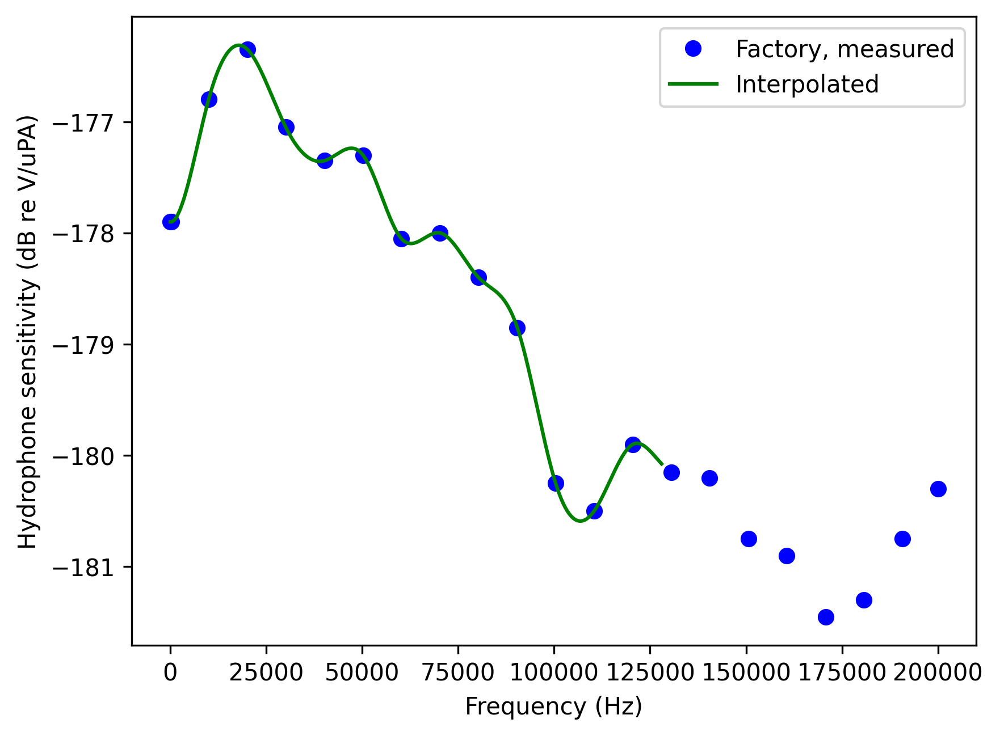

In [15]:
# define hydrophone calibration data
calfreq = [0,250,10000,20100,30100,40200,50200,60200,70300,80300,90400,100400,110400,120500,130500,140500,150600,160600,170700,180700,190700,200000]
calsens = [-177.90,-177.90,-176.80,-176.35,-177.05,-177.35,-177.30,-178.05,-178.00,-178.40,-178.85,-180.25,-180.50,-179.90,-180.15,-180.20,-180.75,-180.90,-181.45,-181.30,-180.75,-180.30]

# interpolate to the frequency resolution of the spectrogram
tck = interpolate.splrep(calfreq, calsens, s=0)
isens = interpolate.splev(f_input, tck, der=0)
plt.figure(dpi=300)
im = plt.plot(calfreq,calsens,'bo',f_input,isens,'g')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Hydrophone sensitivity (dB re V/uPA)')
plt.legend(['Factory, measured', 'Interpolated'])


In [16]:
# replicate interpolated sensitivity
isensg = np.transpose(np.tile(isens,[nseg,1]))
isensg.shape

(131073, 600)

In [17]:
sg_input.shape

(131073, 600)

### Plot the calibrated spectrogram

Text(0.5, 1.0, 'Calibrated spectrum levels (dB) of the 256 kHz sample-rate input data')

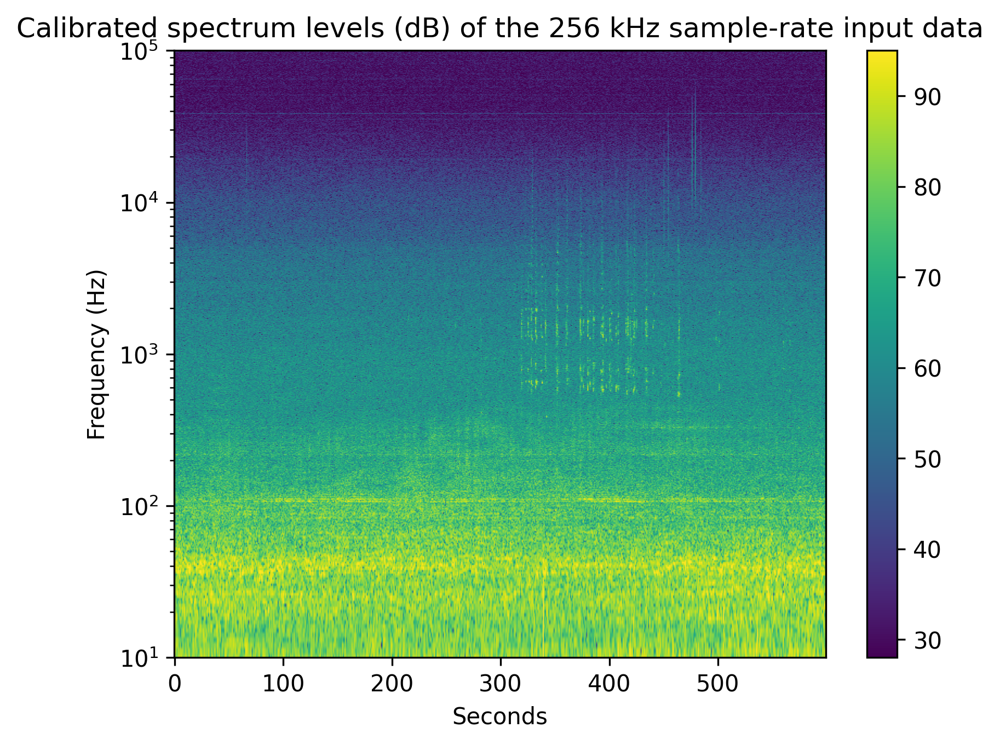

In [18]:
plt.figure(dpi=300)
im = plt.imshow(sg_input-isensg,aspect='auto',origin='lower',vmin=28,vmax=95)
plt.yscale('log')
plt.ylim(10,100000)
plt.colorbar(im)
plt.xlabel('Seconds')
plt.ylabel('Frequency (Hz)')
plt.title('Calibrated spectrum levels (dB) of the 256 kHz sample-rate input data')

## Decimate
In this example, we will decimate the raw data from the original sample rate of 256 kHz down to the final output sample rate of 2 kHz.  This decimation processing can be organized into a few steps, as defined below.

### Step 1: Allocate the decimation task to two concatenated stages.


In [19]:
samplingfreq_output_final = 25.6e3 # In Hz.
# note: forcing downsampleing ratio to be an integer. Non-integral downsampling not possible with this code
ratio_downsampling = int(sample_rate/samplingfreq_output_final)
#
# Allocate the decimation to two stages: ratio_downsampling = ratio_downsampling_1st_stage * ratio_downsampling_2nd_stage
# using the algorithm in R. Crochiere and L. Rabiner, L, "Optimum FIR Digital Implementations for Decimation, Interpolation, and Narrow-Band Filtering, "
# IEEE Transactions on Acoustic, Speech, and Signal Processing, ASSP-23(5), pp. 444-456, 1975.
#
ratio_BWoverNyquistfreq = 0.1 # Assuming that in the 2nd stage, the ratio of transition bandwidth over Nyquist frequency is 0.1
ratio_downsampling_1st_stage_tmp = 2.0 * ratio_downsampling *\
  (1.0-math.sqrt(ratio_downsampling*ratio_BWoverNyquistfreq/(2.0-ratio_BWoverNyquistfreq)))/\
  (2.0-ratio_BWoverNyquistfreq*(ratio_downsampling+1))
#
# Find the integer closest to ratio_downsampling_1st_stage_tmp, and assign this integer value to ratio_downsampling_1st_stage
ratio_downsampling_1st_stage = 2 # Initialized.
diff = ratio_downsampling # Initialized.
for k in range(2, ratio_downsampling):
  if (ratio_downsampling%k == 0):
    if (abs(ratio_downsampling_1st_stage_tmp-k) < diff):
      diff = abs(ratio_downsampling_1st_stage_tmp-k)
      ratio_downsampling_1st_stage = k
#
ratio_downsampling_2nd_stage = int(ratio_downsampling / ratio_downsampling_1st_stage)
samplingfreq_output_1st_stage = sample_rate / ratio_downsampling_1st_stage # Sampling frequency of the 1st-stage decimation output
#
print('Raw data sample rate = ' + str(int(sample_rate)) + ' Hz. Final output sample rate = ' + str(int(samplingfreq_output_final)) + ' Hz. Overall decimation factor = ' + str(int(ratio_downsampling)))
print('1st-stage decimator reduces sample rate from ' + str(int(sample_rate)) + ' Hz to ' + str(int(samplingfreq_output_1st_stage)) + ' Hz, at a decimation factor of ' + str(int(ratio_downsampling_1st_stage)))
print('2nd-stage decimator reduces sample rate from ' + str(int(samplingfreq_output_1st_stage)) + ' Hz to ' + str(int(samplingfreq_output_final)) + ' Hz, at a decimation factor of ' + str(int(ratio_downsampling_2nd_stage)))

Raw data sample rate = 256000 Hz. Final output sample rate = 25600 Hz. Overall decimation factor = 10
1st-stage decimator reduces sample rate from 256000 Hz to 51200 Hz, at a decimation factor of 5
2nd-stage decimator reduces sample rate from 51200 Hz to 25600 Hz, at a decimation factor of 2


###Step 2: Design the optimized windowed-sinc anti-aliasing filter in each stage.

In [20]:
def BlackmanSincFilter(samplingfreq_in, samplingfreq_out, samplingfreq_output_final):
# Blackman window parameters:
    alpha = 0.16
    a0 = (1.0-alpha)/2.0
    a1 = 0.5
    a2 = alpha/2.0
#
    lenDFT = 2**14 # Number of FFT data points. Frequency resolution = samplingfreq_in/lenDFT
    VectorDFT = np.arange(0, int(lenDFT/2), 1, int)
#
    thresh_dB_stopband = -74.0 # Stopband attenuation when using Blackman filter.
#
    if (samplingfreq_out != samplingfreq_output_final): # 1st-stage
        thresh_dB_passband = -0.1
        passfreq = samplingfreq_output_final/2.0
        stopfreq = samplingfreq_out - passfreq
# For example, in decimation 256 kHz --> 8 kHz --> 2 kHz,
# for the 1st-stage filter: samplingfreq_in = sample_rate = 256 kHz, samplingfreq_out = 8 kHz.
# passfreq = 2kHz/2 = 1 kHz. Thus the passband is from zero to 1 kHz.
# stopfreq = 8 kHz - 1 kHz = 7 kHz. Thus the stopband is from 7 kHz to 128 kHz. (4 kHz is the Nyquist frequency of the 1st-stage filter.)
# When the data is down-sampled from 256 kHz to 8 kHz,
# the passband spectrum from 4 kHz to 7 kHz is aliased and folded back to 1 kHz to 4 kHz.
# Nonetheless, this aliased spectral section (1-4 kHz) will be filtered out in the 2nd-stage decimation.
        deltafreq = 100.0 # In Hz. Resolution of the search grid.
        MLW = (stopfreq-passfreq) + np.arange(0.0,  (deltafreq*(50+1)), deltafreq, float)
# We want the MLW search range to be sufficiently wide yet not too wide in order to reduce computation.
# This range is wider for the 1st-stage filter than for the 2nd-stage filter.
# This range may need adjustment for different values of samplingfreq_in.
    else:
        thresh_dB_passband = -1.0
        bufferband = 100.0 # In Hz. Only for 2nd-stage filter. 256 kHz --> 32 kHz --> 16 kHz,
        passfreq = (samplingfreq_out/2.0) - bufferband
        stopfreq = samplingfreq_out/2.0
# For example, in decimation 256 kHz --> 8 kHz --> 2 kHz,
# for the 2nd-stage filter: samplingfreq_in = 8 kHz, samplingfreq_out = samplingfreq_output_final = 2 kHz.
# passfreq = 2kHz/2 - 100 Hz = 900 Hz. Thus the passband is from zero to 900 Hz.
# stopfreq = 2kHz/2 = 1 kHz. Thus the stopband is from 1 kHz to 4 kHz. (4 kHz is the Nyquist frequency of the 2nd-stage filter.)
        deltafreq = 10.0 # In Hz. Resolution of the search grid.
        MLW = (stopfreq-passfreq) + np.arange(0.0, (deltafreq*(20+1)), deltafreq, float)
#
    Cutofffreq_sinc = np.arange(passfreq, stopfreq + deltafreq, deltafreq)
#
    Freq = (VectorDFT/lenDFT)*samplingfreq_in
    Ind_passband = np.where(Freq <= passfreq)
    Ind_stopband = np.where(Freq >= stopfreq)
#
    Filterlength_Blackman_satisfactory = np.empty((len(Cutofffreq_sinc), len(MLW)))
    Filterlength_Blackman_satisfactory[:] = np.NaN
#
    for k in range(len(MLW)):
        transitionMLW_radian = (MLW[k] / (samplingfreq_in / 2.0)) * math.pi
        filterlength_Blackman_0 = math.ceil(12.0*math.pi/transitionMLW_radian)
        if (filterlength_Blackman_0%2 == 0):
            filterlength_Blackman = filterlength_Blackman_0 + 1
        else:
            filterlength_Blackman = filterlength_Blackman_0
# We want filterlength_Blackman to be an odd number,
# so that the filter-induced delay (filterlength_Blackman-1)/2 is an integer. Used below.
        Vectortmp = np.arange(0, filterlength_Blackman)
        Vectortmp2 = Vectortmp/(filterlength_Blackman-1)
        Window_Blackman = a0 - a1*np.cos(2.0*math.pi*Vectortmp2) + a2*np.cos(4.0*math.pi*Vectortmp2)
#
        for m in range(len(Cutofffreq_sinc)):
            SincFun = np.sinc(2.0*(Cutofffreq_sinc[m]/samplingfreq_in)*(Vectortmp-((filterlength_Blackman-1)/2)))
            Filter_Blackman_0 = np.multiply(SincFun, Window_Blackman)
            Filter_Blackman = Filter_Blackman_0/np.sum(Filter_Blackman_0)
            DFT_filter_Blackman_0 = np.fft.fft(Filter_Blackman, lenDFT)
            DFT_filter_Blackman = DFT_filter_Blackman_0[0:int(lenDFT/2)]
            Mag_dB = 20.0*np.log10(np.abs(DFT_filter_Blackman[VectorDFT]))
            if ((min(Mag_dB[Ind_passband]) >= thresh_dB_passband) and (max(Mag_dB[Ind_stopband]) <= thresh_dB_stopband)):
                Filterlength_Blackman_satisfactory[m][k] = filterlength_Blackman
#
    Vec_filterlength_Blackman_satisfactory = np.reshape(Filterlength_Blackman_satisfactory, (1, (len(MLW)*len(Cutofffreq_sinc))), order='F')
    indtmp = np.nanargmin(Vec_filterlength_Blackman_satisfactory)
    ind_MLW_minfilterlength = math.floor(indtmp/len(Cutofffreq_sinc))
    ind_CutofffreqSinc_minfilterlength = indtmp - (ind_MLW_minfilterlength * len(Cutofffreq_sinc))
#
# Having found the optimized combination of MLW and CutofffreqSinc, now we formulate the optimal Blackman-sinc low-pass filter:
    transitionMLW_radian = (MLW[ind_MLW_minfilterlength] / (samplingfreq_in/2.0)) * math.pi
    filterlength_Blackman_0 = math.ceil(12.0*math.pi/transitionMLW_radian)
    if (filterlength_Blackman_0%2 == 0):
        filterlength_Blackman = filterlength_Blackman_0 + 1
    else:
        filterlength_Blackman = filterlength_Blackman_0
#
    Vectortmp = np.arange(0, filterlength_Blackman)
    Vectortmp2 = Vectortmp/(filterlength_Blackman-1)
    Window_Blackman = a0 - a1*np.cos(2.0*math.pi*Vectortmp2) + a2*np.cos(4.0*math.pi*Vectortmp2)
    SincFun = np.sinc(2.0*(Cutofffreq_sinc[ind_CutofffreqSinc_minfilterlength]/samplingfreq_in)*(Vectortmp-((filterlength_Blackman-1)/2)))
    Filter_Blackman_0 = np.multiply(SincFun, Window_Blackman)
    Filter_Blackman = Filter_Blackman_0 / np.sum(Filter_Blackman_0)
    return Filter_Blackman
#
#
Filter_1st_stage = BlackmanSincFilter(sample_rate, samplingfreq_output_1st_stage, samplingfreq_output_final)
Filter_2nd_stage = BlackmanSincFilter(samplingfreq_output_1st_stage, samplingfreq_output_final, samplingfreq_output_final)
#
print('Length of first stage filter: ' + str(int(len(Filter_1st_stage))))
print('Length of second stage filter: ' + str(int(len(Filter_2nd_stage))))
#print(np.sum(Filter_1st_stage))
#print(np.sum(Filter_2nd_stage))

Length of first stage filter: 51
Length of second stage filter: 2049


###Step 3: Run the raw input data through the 1st-stage filter, downsample, then through the 2nd-stage filter, and down-sample again.

In [21]:
S_filtered_1_full = np.convolve(v, Filter_1st_stage, 'full')
S_filtered_1 = S_filtered_1_full[0:len(v)]
S_filtered_1_decimated = S_filtered_1[0:len(S_filtered_1):ratio_downsampling_1st_stage]
S_filtered_2 = np.convolve(S_filtered_1_decimated, Filter_2nd_stage, 'same');
S_filtered_2_decimated = S_filtered_2[0:len(S_filtered_2):ratio_downsampling_2nd_stage]
#
# Verify power is conserved through the decimation process:
#print(np.mean(np.square(S_filtered_1[0:sample_rate])))
#print(np.mean(np.square(S_filtered_1_decimated[0:int(sample_rate/ratio_downsampling_1st_stage)])))
#print(np.mean(np.square(S_filtered_2[0:int(sample_rate/ratio_downsampling_1st_stage)])))
#print(np.mean(np.square(S_filtered_2_decimated[0:int(samplingfreq_output_final)])))
#print(S_filtered_1_decimated.size)
#print(S_filtered_2_decimated.size)

### Compute and plot the spectrogram of the decimated data


In [22]:
# correct to actual sample frequency
#samplingfreq_output_final = 25600
print(f"samplingfreq_output_final {samplingfreq_output_final}" )



samplingfreq_output_final 25600.0


600 segments of length 1 seconds in 600.0 seconds of audio
32768
Comparing power of the decimated signal computed in the time domain versus that computed in the frequency domain:
0.000120017125
0.0001184648005115206


Text(0.5, 1.0, 'Calibrated spectrum levels (dB) of the 25600.0Hz sample-rate decimated data')

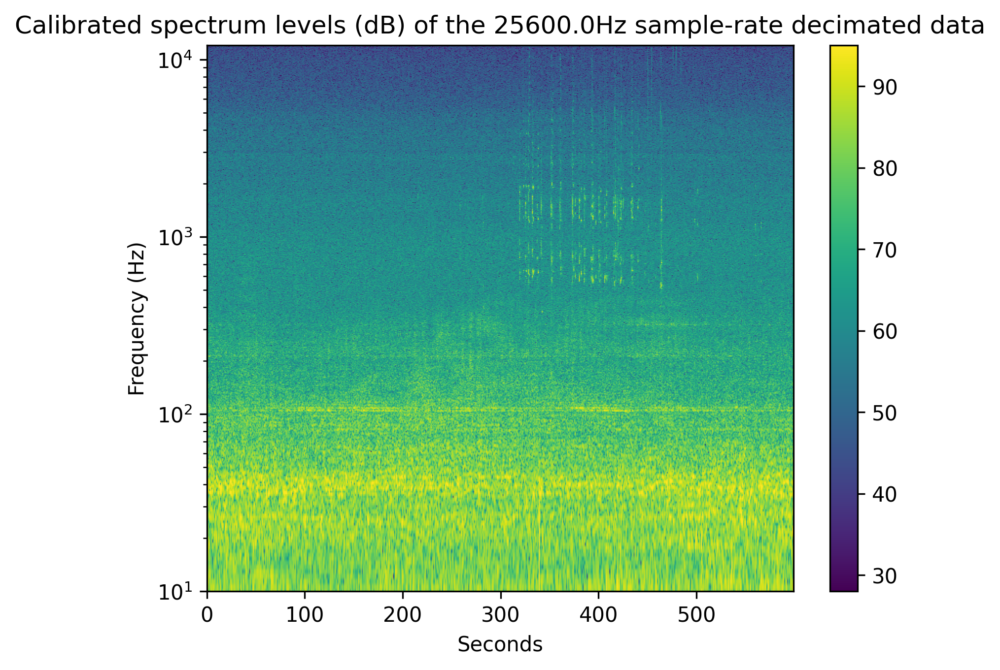

In [23]:
nsec_decimated = (S_filtered_2_decimated.size)/samplingfreq_output_final # number of seconds in vector
nseg_decimated = int(nsec_decimated/spa)
print(f'{nseg_decimated} segments of length {spa} seconds in {nsec_decimated} seconds of audio')
#
lenfft_decimated = 2**int(np.ceil(np.log2(samplingfreq_output_final)))
print(lenfft_decimated)
#
numDataPoints_decimated = int(samplingfreq_output_final*spa)
#
Ind_keep_decimated = np.arange(int(0), int(lenfft_decimated/2+1))
f_decimated = (Ind_keep_decimated/lenfft_decimated) * samplingfreq_output_final
#
# initialize empty LTSA
nfreq_decimated = int(lenfft_decimated/2+1)
sg_decimated = np.empty((nfreq_decimated, nseg_decimated), float)
#
# get window
w_decimated = scipy.signal.get_window('blackman', numDataPoints_decimated)
# Calculate spectrogram
for x_decimated in range(0,nseg_decimated):
  cstart_decimated = x_decimated*spa*int(samplingfreq_output_final)
  cend_decimated = (x_decimated+1)*spa*int(samplingfreq_output_final)
#  f_decimated,psd_decimated = scipy.signal.welch(S_filtered_2_decimated[cstart_decimated:cend_decimated], fs=samplingfreq_output_final, window=w_decimated, noverlap=0, nfft=lenfft_decimated)
  psd_decimated = (np.square(np.absolute(np.fft.fft(np.multiply(S_filtered_2_decimated[cstart_decimated:cend_decimated],w_decimated), n=lenfft_decimated))))/(numDataPoints_decimated*window_correction)/samplingfreq_output_final
#
  psd_decimated_log10 = 10*np.log10(psd_decimated[Ind_keep_decimated])
  sg_decimated[:,x_decimated] = np.transpose(psd_decimated_log10)
#
  if (x_decimated == 0): # Changed x to x_decimated for consistency
    psd_decimated_check = psd_decimated
    print("Comparing power of the decimated signal computed in the time domain versus that computed in the frequency domain:")
    print(np.mean(np.square(v[cstart:cend]))) # Assuming cstart and cend are defined earlier
    print(sum(psd_decimated_check)*(samplingfreq_output_final/lenfft_decimated))
#
isens_FreqRangeAfterDecimation = interpolate.splev(f_decimated, tck, der=0)
isensg_FreqRangeAfterDecimation = np.transpose(np.tile(isens_FreqRangeAfterDecimation,[nseg_decimated,1])) # Changed nseg to nseg_decimated
#
Extent = [0, nseg_decimated-1, 0.0, samplingfreq_output_final/2.0]
plt.figure(dpi=300)
im = plt.imshow(sg_decimated-isensg_FreqRangeAfterDecimation, aspect='auto', origin='lower', extent=Extent, vmin=28,vmax=95)
plt.yscale('log')
plt.ylim(10,12e3)
plt.colorbar(im)
plt.xlabel('Seconds')
plt.ylabel('Frequency (Hz)')
plt.title(f'Calibrated spectrum levels (dB) of the {samplingfreq_output_final}Hz sample-rate decimated data')

###Compare PSDs of the input data and the decimated data for verification purposes

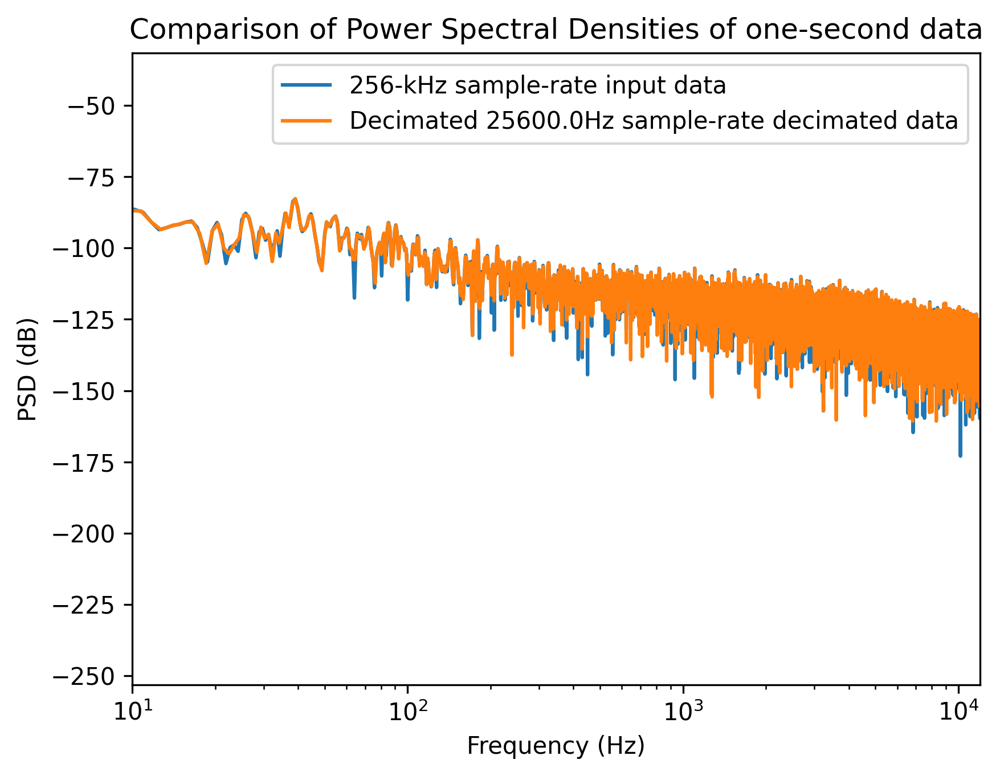

In [24]:
plt.figure(dpi=300)
plt.plot(f_decimated, sg_decimated[:,0], label='256-kHz sample-rate input data')
plt.plot(f_input, sg_input[:,0], label=f'Decimated {samplingfreq_output_final}Hz sample-rate decimated data')
plt.xlim(10,12e3)
plt.xlabel('Frequency (Hz)')
plt.xscale('log')
plt.ylabel('PSD (dB)')
plt.title('Comparison of Power Spectral Densities of one-second data')
plt.legend()
plt.savefig(f'PSD_{basefilename}.png')

In [25]:
copy_file('/content', '/content/drive/MyDrive/audio_spectrograms',f'PSD_{basefilename}.png')

File 'PSD_MARS_20180413_075913.png' copied from '/content' to '/content/drive/MyDrive/audio_spectrograms'.


## save the downsampled result as a .wav file

In [26]:
## save the downsampled result as a .wav file

sf.write(f'/content/25600_{basename}', S_filtered_2_decimated, int(samplingfreq_output_final))

## do third decimation step with SoX to subsample to 24kHz

In [27]:
!apt-get install sox
!apt-get install libsox-fmt-mp3
!pip install git+https://github.com/rabitt/pysox.git



!pip install librosa #scipy #soundfile


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1
Suggested packages:
  libsox-fmt-all
The following NEW packages will be installed:
  libopencore-amrnb0 libopencore-amrwb0 libsox-fmt-alsa libsox-fmt-base libsox3 libwavpack1 sox
0 upgraded, 7 newly installed, 0 to remove and 29 not upgraded.
Need to get 617 kB of archives.
After this operation, 1,764 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libopencore-amrnb0 amd64 0.1.5-1 [94.8 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 libopencore-amrwb0 amd64 0.1.5-1 [49.1 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libsox3 amd64 14.4.2+git20190427-2+deb11u2ubuntu0.22.04.1 [240 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 libs

In [28]:




import sox

from scipy.io.wavfile import read, write
from IPython.display import Audio
from numpy.fft import fft, ifft
#%matplotlib inline


def downsample_audio(input_file, output_file, original_sr=25600, target_sr=24000):
    """
    downsamples an audio file from original_sr to target_sr librosa.

    librosa provides a resampling function that is designed to minimize spectral artifacts during the resampling process

    Parameters:
    - input_file: Path to the input audio file.
    - output_file: Path to save the decimated audio file.
    - original_sr: Original sample rate (default: 25.6 kHz).
    - target_sr: Desired output sample rate (default: 24 kHz).
    """
    ## Load the audio file using librosa
    #audio_data, sr = librosa.load(input_file, sr=original_sr)

    ## Decimate the audio data
    ##decimated_audio = signal.decimate(audio_data, original_sr // target_sr, ftype='fir', zero_phase=True)

    ## Resample the audio data -- should work with non-integral resampling
    #resampled_audio = librosa.resample(audio_data, orig_sr=original_sr, target_sr=target_sr, res_type='kaiser_best')

    ## Save the resampled audio to a new file using soundfile
    ## Very high-quality FFT-based bandlimited interpolation.

    ## Save the resampled audio to a new file using soundfile
    #sf.write(output_file, resampled_audio, target_sr)

    # As an alternative, use SoX to decimate/resample the audio data directly. the -v flag is for very high quality.
    !sox {input_file} {output_file} rate -v {target_sr}

    #!sox {input_file} -r {target_sr} {output_file} sinc -s 12000 -p 100 #per Claude -- seems bogus

    print(f"Audio resampled from {original_sr}Hz to {target_sr}Hz and saved to {output_file}")


In [29]:
target_sr = 24000
original_sr =25600
downsample_audio(f'/content/25600_{basename}',f'/content/24kHz_{basename}', original_sr=25600, target_sr=24000)

Audio resampled from 25600Hz to 24000Hz and saved to /content/24kHz_MARS_20180413_075913.wav


In [30]:
copy_file('/content', '/content/drive/MyDrive/pacific-sound',f'25600_{basename}')
copy_file('/content', '/content/drive/MyDrive/pacific-sound',f'24kHz_{basename}')


File '25600_MARS_20180413_075913.wav' copied from '/content' to '/content/drive/MyDrive/pacific-sound'.
File '24kHz_MARS_20180413_075913.wav' copied from '/content' to '/content/drive/MyDrive/pacific-sound'.


Modify the decimated audio file:
* remove the DC offset (center on zero)
* increase the signal amplitude
* fade in and out to filter out transient at beginning and end

For this we use Sound Exchange (Sox)

In [31]:
sample_rate = target_sr

tfm = sox.Transformer()
tfm.highpass(10)
tfm.fade(fade_in_len=1, fade_out_len=1)
tfm.norm(db_level = -3.0)

In [32]:
psound_file = f'/content/24kHz_{basename}'

processed_audio_file = tfm.build(input_filepath=psound_file, output_filepath=f'24kHz_normalized_{basename}')

In [33]:
copy_file('/content', '/content/drive/MyDrive/pacific-sound',f'24kHz_normalized_{basename}')
copy_file('/content', '/content/drive/MyDrive/audio_chunks',f'24kHz_normalized_{basename}')


File '24kHz_normalized_MARS_20180413_075913.wav' copied from '/content' to '/content/drive/MyDrive/pacific-sound'.
File '24kHz_normalized_MARS_20180413_075913.wav' copied from '/content' to '/content/drive/MyDrive/audio_chunks'.


In [34]:
# plot spectrogram of final subsampled file

In [35]:

## read from a file

x, sample_rate = sf.read(f'/content/drive/MyDrive/pacific-sound/24kHz_{basename}')
## write in a difference format
#sf.write('new_file.flac', x, sample_rate)

In [36]:
# convert scaled voltage to volts
v = x*3
nsec = (v.size)/sample_rate # number of seconds in vector
spa = 1  # seconds per average
nseg = int(nsec/spa)
print(f'{nseg} segments of length {spa} seconds in {nsec} seconds of audio')

600 segments of length 1 seconds in 600.0 seconds of audio


In [37]:
lenfft_input = 2**int(np.ceil(np.log2(sample_rate)))
print(lenfft_input)
#
# initialize empty LTSA
nfreq = int(lenfft_input/2+1)
sg_input = np.empty((nfreq, nseg), float)
sg_input.shape

32768


(16385, 600)

In [38]:
# get window
w_input = scipy.signal.get_window('blackman',sample_rate)
window_correction = np.mean(np.square(w_input))
#
numDataPoints_input = int(sample_rate*spa)
#
Ind_keep = np.arange(0, int(lenfft_input/2)+1)
f_input = (Ind_keep/lenfft_input) * sample_rate
#
# Calculate spectrogram
for x in range(0,nseg):
  cstart = x*spa*sample_rate
  cend = (x+1)*spa*sample_rate
#  f,psd = scipy.signal.welch(v[cstart:cend], fs=sample_rate, window=w_input, nfft=sample_rate)
  psd_input = np.square(np.absolute(np.fft.fft(np.multiply(v[cstart:cend],w_input), n=lenfft_input)))/(numDataPoints_input*window_correction)/sample_rate
  psd_input_log10 = 10*np.log10(psd_input[Ind_keep])
  sg_input[:,x] = psd_input_log10
  if (x == 0):
    psd_input_check = psd_input
    print("Comparing power of the input signal computed in the time domain versus that computed in the frequency domain:")
    print(np.mean(np.square(v[cstart:cend])))
    print(sum(psd_input_check)*(sample_rate/lenfft_input))

Comparing power of the input signal computed in the time domain versus that computed in the frequency domain:
0.0010692577332956717
0.0010692245863067383


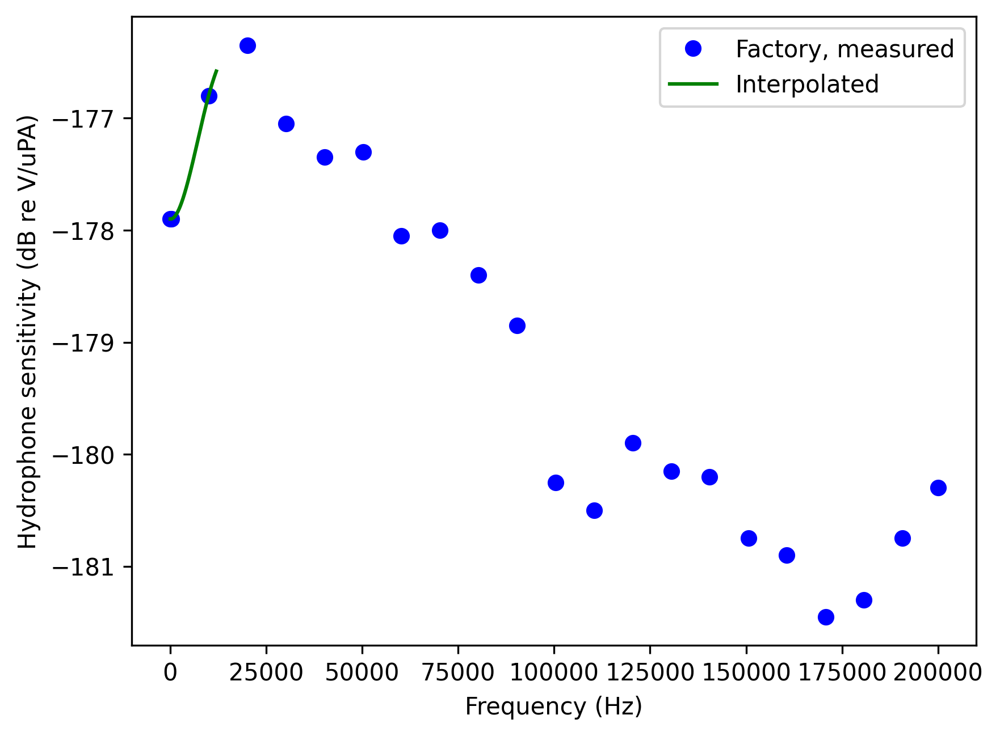

In [39]:
# define hydrophone calibration data
calfreq = [0,250,10000,20100,30100,40200,50200,60200,70300,80300,90400,100400,110400,120500,130500,140500,150600,160600,170700,180700,190700,200000]
calsens = [-177.90,-177.90,-176.80,-176.35,-177.05,-177.35,-177.30,-178.05,-178.00,-178.40,-178.85,-180.25,-180.50,-179.90,-180.15,-180.20,-180.75,-180.90,-181.45,-181.30,-180.75,-180.30]

# interpolate to the frequency resolution of the spectrogram
tck = interpolate.splrep(calfreq, calsens, s=0)
isens = interpolate.splev(f_input, tck, der=0)
plt.figure(dpi=300)
im = plt.plot(calfreq,calsens,'bo',f_input,isens,'g')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Hydrophone sensitivity (dB re V/uPA)')
plt.legend(['Factory, measured', 'Interpolated'])


In [40]:
# replicate interpolated sensitivity
isensg = np.transpose(np.tile(isens,[nseg,1]))
isensg.shape

(16385, 600)

In [41]:
sg_input.shape

(16385, 600)

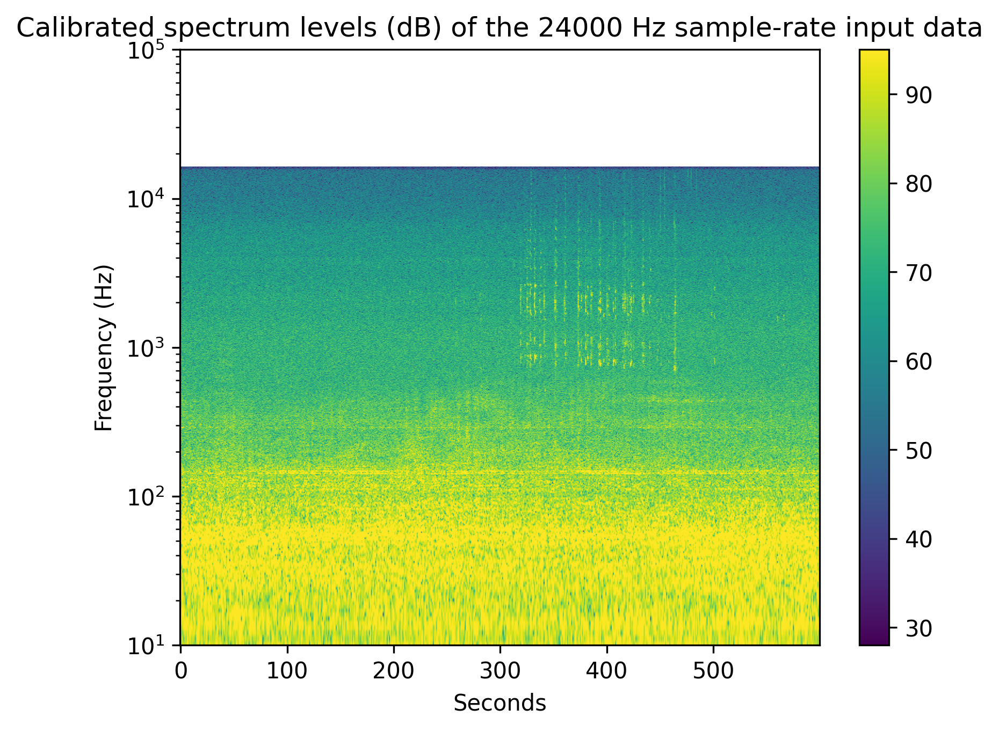

In [42]:
plt.figure(dpi=300)
# plot calibrated
im = plt.imshow(sg_input-isensg,aspect='auto',origin='lower',vmin=28,vmax=95)
#plot uncalibrated
#im = plt.imshow(sg_input,aspect='auto',origin='lower',vmin=28,vmax=95)
plt.yscale('log')
plt.ylim(10,100000)
plt.colorbar(im)
plt.xlabel('Seconds')
plt.ylabel('Frequency (Hz)')
plt.title(f'Calibrated spectrum levels (dB) of the {sample_rate} Hz sample-rate input data')
plt.savefig(f'24kHz_{basefilename}.png')

In [43]:
copy_file('/content', '/content/drive/MyDrive/audio_spectrograms',f'24kHz_{basefilename}.png')

File '24kHz_MARS_20180413_075913.png' copied from '/content' to '/content/drive/MyDrive/audio_spectrograms'.
